In [103]:
pip install pyforest   #pyforest is package of all the libraries without need to import them individually

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#pyforest'


In [110]:
import pyforest

In [111]:
covid=pd.read_csv("country_vaccinations.csv")
covid

<IPython.core.display.Javascript object>

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Albania,ALB,2021-01-10,0.0,0.0,NaN,NaN,NaN,0.00,0.00,NaN,NaN,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
1,Albania,ALB,2021-01-11,NaN,NaN,NaN,NaN,64.0,NaN,NaN,NaN,22.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
2,Albania,ALB,2021-01-12,128.0,128.0,NaN,NaN,64.0,0.00,0.00,NaN,22.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
3,Albania,ALB,2021-01-13,188.0,188.0,NaN,60.0,63.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
4,Albania,ALB,2021-01-14,266.0,266.0,NaN,78.0,66.0,0.01,0.01,NaN,23.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
5,Albania,ALB,2021-01-15,308.0,308.0,NaN,42.0,62.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
6,Albania,ALB,2021-01-16,369.0,369.0,NaN,61.0,62.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
7,Albania,ALB,2021-01-17,405.0,405.0,NaN,36.0,58.0,0.01,0.01,NaN,20.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
8,Albania,ALB,2021-01-18,447.0,447.0,NaN,42.0,55.0,0.02,0.02,NaN,19.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...
9,Albania,ALB,2021-01-19,483.0,483.0,NaN,36.0,51.0,0.02,0.02,NaN,18.0,Pfizer/BioNTech,Ministry of Health,https://shendetesia.gov.al/covid19-ministria-e...


In [112]:
covid.drop(['iso_code'],inplace=True,axis=1)
covid.drop(['date'],inplace=True,axis=1)
covid.drop(['source_name'],inplace=True,axis=1)
covid.drop(['source_website'],inplace=True,axis=1)

In [113]:
covid.head(10)

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines
0,Albania,0.0,0.0,NaN,NaN,NaN,0.00,0.00,NaN,NaN,Pfizer/BioNTech
1,Albania,NaN,NaN,NaN,NaN,64.0,NaN,NaN,NaN,22.0,Pfizer/BioNTech
2,Albania,128.0,128.0,NaN,NaN,64.0,0.00,0.00,NaN,22.0,Pfizer/BioNTech
3,Albania,188.0,188.0,NaN,60.0,63.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech
4,Albania,266.0,266.0,NaN,78.0,66.0,0.01,0.01,NaN,23.0,Pfizer/BioNTech
5,Albania,308.0,308.0,NaN,42.0,62.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech
6,Albania,369.0,369.0,NaN,61.0,62.0,0.01,0.01,NaN,22.0,Pfizer/BioNTech
7,Albania,405.0,405.0,NaN,36.0,58.0,0.01,0.01,NaN,20.0,Pfizer/BioNTech
8,Albania,447.0,447.0,NaN,42.0,55.0,0.02,0.02,NaN,19.0,Pfizer/BioNTech
9,Albania,483.0,483.0,NaN,36.0,51.0,0.02,0.02,NaN,18.0,Pfizer/BioNTech


## Exploratory data analysis

In [114]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3619 entries, 0 to 3618
Data columns (total 11 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              3619 non-null   object 
 1   total_vaccinations                   2393 non-null   float64
 2   people_vaccinated                    1981 non-null   float64
 3   people_fully_vaccinated              1324 non-null   float64
 4   daily_vaccinations_raw               2019 non-null   float64
 5   daily_vaccinations                   3483 non-null   float64
 6   total_vaccinations_per_hundred       2393 non-null   float64
 7   people_vaccinated_per_hundred        1981 non-null   float64
 8   people_fully_vaccinated_per_hundred  1324 non-null   float64
 9   daily_vaccinations_per_million       3483 non-null   float64
 10  vaccines                             3619 non-null   object 
dtypes: float64(9), object(2)
memor

In [115]:
covid.isna().sum()       #check for null values

country                                   0
total_vaccinations                     1226
people_vaccinated                      1638
people_fully_vaccinated                2295
daily_vaccinations_raw                 1600
daily_vaccinations                      136
total_vaccinations_per_hundred         1226
people_vaccinated_per_hundred          1638
people_fully_vaccinated_per_hundred    2295
daily_vaccinations_per_million          136
vaccines                                  0
dtype: int64

In [116]:
covid.isna().mean()*100   #percentage of error in whole data

country                                 0.000000
total_vaccinations                     33.876762
people_vaccinated                      45.261122
people_fully_vaccinated                63.415308
daily_vaccinations_raw                 44.211108
daily_vaccinations                      3.757944
total_vaccinations_per_hundred         33.876762
people_vaccinated_per_hundred          45.261122
people_fully_vaccinated_per_hundred    63.415308
daily_vaccinations_per_million          3.757944
vaccines                                0.000000
dtype: float64

## Feature engineering

#### Filling NaN values with mean values of that column

In [117]:
mean_1=covid['total_vaccinations'].mean()
print(mean_1)

1521027.7367321353


In [118]:
mean_2=covid['people_vaccinated'].mean()
print(mean_2)

1269656.6744068651


In [119]:
mean_3=covid['people_fully_vaccinated'].mean()
print(mean_3)

388886.08081570995


In [120]:
mean_4=covid['daily_vaccinations_raw'].mean()
print(mean_4)
mean_5=covid['daily_vaccinations'].mean()
print(mean_5)
mean_6=covid['total_vaccinations_per_hundred'].mean()
print(mean_6)
mean_7=covid['people_vaccinated_per_hundred'].mean()
print(mean_7)
mean_8=covid['people_fully_vaccinated_per_hundred'].mean()
print(mean_8)
mean_9=covid['daily_vaccinations_per_million'].mean()
print(mean_9)

74536.08023774145
57547.96468561585
6.174784788967838
5.243503281171128
1.8073640483383684
2279.3158196956647


In [121]:
covid['total_vaccinations']=covid['total_vaccinations'].fillna(mean_1)
covid['people_vaccinated']=covid['people_vaccinated'].fillna(mean_2)
covid['people_fully_vaccinated']=covid['people_fully_vaccinated'].fillna(mean_3)
covid['daily_vaccinations_raw']=covid['daily_vaccinations_raw'].fillna(mean_4)
covid['daily_vaccinations']=covid['daily_vaccinations'].fillna(mean_5)
covid['total_vaccinations_per_hundred']=covid['total_vaccinations_per_hundred'].fillna(mean_6)
covid['people_vaccinated_per_hundred']=covid['people_vaccinated_per_hundred'].fillna(mean_7)
covid['people_fully_vaccinated_per_hundred']=covid['people_fully_vaccinated_per_hundred'].fillna(mean_8)
covid['daily_vaccinations_per_million']=covid['daily_vaccinations_per_million'].fillna(mean_9)

In [122]:
covid

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines
0,Albania,0.000000e+00,0.000000e+00,3.888861e+05,7.453608e+04,5.754796e+04,0.000000,0.000000,1.807364,2279.31582,Pfizer/BioNTech
1,Albania,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,6.400000e+01,6.174785,5.243503,1.807364,22.00000,Pfizer/BioNTech
2,Albania,1.280000e+02,1.280000e+02,3.888861e+05,7.453608e+04,6.400000e+01,0.000000,0.000000,1.807364,22.00000,Pfizer/BioNTech
3,Albania,1.880000e+02,1.880000e+02,3.888861e+05,6.000000e+01,6.300000e+01,0.010000,0.010000,1.807364,22.00000,Pfizer/BioNTech
4,Albania,2.660000e+02,2.660000e+02,3.888861e+05,7.800000e+01,6.600000e+01,0.010000,0.010000,1.807364,23.00000,Pfizer/BioNTech
5,Albania,3.080000e+02,3.080000e+02,3.888861e+05,4.200000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,Pfizer/BioNTech
6,Albania,3.690000e+02,3.690000e+02,3.888861e+05,6.100000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,Pfizer/BioNTech
7,Albania,4.050000e+02,4.050000e+02,3.888861e+05,3.600000e+01,5.800000e+01,0.010000,0.010000,1.807364,20.00000,Pfizer/BioNTech
8,Albania,4.470000e+02,4.470000e+02,3.888861e+05,4.200000e+01,5.500000e+01,0.020000,0.020000,1.807364,19.00000,Pfizer/BioNTech
9,Albania,4.830000e+02,4.830000e+02,3.888861e+05,3.600000e+01,5.100000e+01,0.020000,0.020000,1.807364,18.00000,Pfizer/BioNTech


### Label encoding

In [123]:
from sklearn import preprocessing
label_encoder=preprocessing.LabelEncoder()
x=covid['country']=label_encoder.fit_transform(covid['country'])
x=covid['vaccines']=label_encoder.fit_transform(covid['vaccines'])

In [124]:
covid

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines
0,0,0.000000e+00,0.000000e+00,3.888861e+05,7.453608e+04,5.754796e+04,0.000000,0.000000,1.807364,2279.31582,11
1,0,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,6.400000e+01,6.174785,5.243503,1.807364,22.00000,11
2,0,1.280000e+02,1.280000e+02,3.888861e+05,7.453608e+04,6.400000e+01,0.000000,0.000000,1.807364,22.00000,11
3,0,1.880000e+02,1.880000e+02,3.888861e+05,6.000000e+01,6.300000e+01,0.010000,0.010000,1.807364,22.00000,11
4,0,2.660000e+02,2.660000e+02,3.888861e+05,7.800000e+01,6.600000e+01,0.010000,0.010000,1.807364,23.00000,11
5,0,3.080000e+02,3.080000e+02,3.888861e+05,4.200000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11
6,0,3.690000e+02,3.690000e+02,3.888861e+05,6.100000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11
7,0,4.050000e+02,4.050000e+02,3.888861e+05,3.600000e+01,5.800000e+01,0.010000,0.010000,1.807364,20.00000,11
8,0,4.470000e+02,4.470000e+02,3.888861e+05,4.200000e+01,5.500000e+01,0.020000,0.020000,1.807364,19.00000,11
9,0,4.830000e+02,4.830000e+02,3.888861e+05,3.600000e+01,5.100000e+01,0.020000,0.020000,1.807364,18.00000,11


In [125]:
covid.describe()

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines
count,3619.000000,3.619000e+03,3.619000e+03,3.619000e+03,3.619000e+03,3.619000e+03,3619.000000,3619.000000,3619.000000,3619.000000,3619.000000
mean,49.993921,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,5.754796e+04,6.174785,5.243503,1.807364,2279.315820,6.836695
std,28.992946,4.096753e+06,3.068937e+06,8.926836e+05,1.542828e+05,1.751032e+05,9.375361,6.357303,2.784294,3716.547251,4.987449
min,0.000000,0.000000e+00,0.000000e+00,1.000000e+00,-5.001200e+04,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.000000,8.260200e+04,1.270790e+05,1.219825e+05,8.589000e+03,1.300000e+03,1.335000,2.120000,1.210000,381.000000,2.000000
50%,48.000000,8.263010e+05,1.269657e+06,3.888861e+05,7.453608e+04,6.898000e+03,5.640000,5.243503,1.807364,1081.000000,5.000000
75%,77.000000,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,4.528050e+04,6.174785,5.243503,1.807364,2279.315820,11.000000
max,97.000000,6.128950e+07,4.280960e+07,1.789567e+07,2.242472e+06,1.916190e+06,87.070000,49.750000,37.320000,30869.000000,18.000000


## Different data visulizations

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

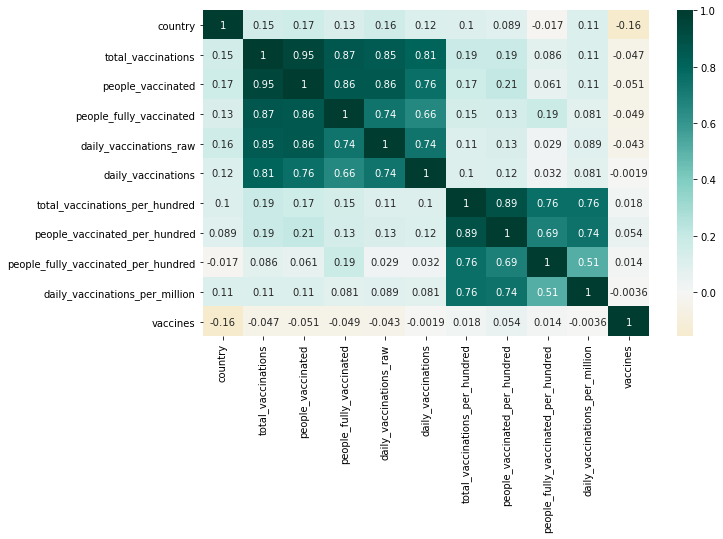

In [65]:
fig,ax=plt.subplots(figsize=(10,6))
sns.heatmap(covid.corr(),center=0,cmap='BrBG',annot=True)

<IPython.core.display.Javascript object>

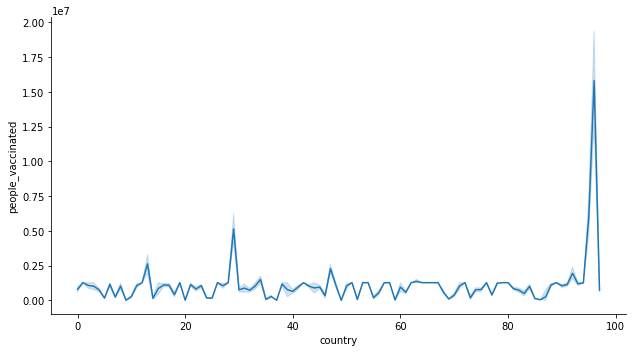

In [66]:
sns.relplot(x="country",y="people_vaccinated",aspect=16/9, kind="line",data=covid);

<IPython.core.display.Javascript object>

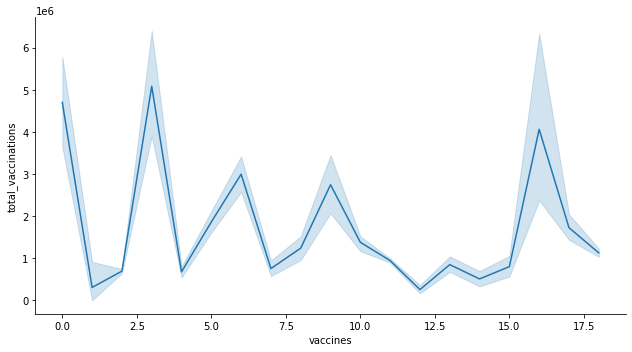

In [67]:
sns.relplot(x="vaccines",y="total_vaccinations",aspect=16/9,kind="line",data=covid);

<IPython.core.display.Javascript object>

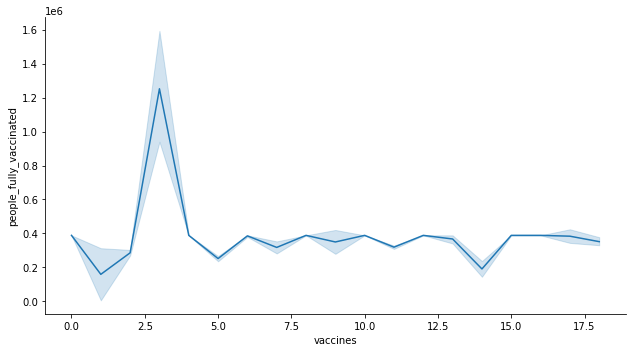

In [68]:
sns.relplot(x="vaccines",y="people_fully_vaccinated",aspect=16/9,kind="line",data=covid);

## Kmeans clustering

In [126]:
def norm_func(i):
    x=(i-i.min())/(i.max()-i.min())
    return(x)

In [127]:
df_norm=norm_func(covid.iloc[:,0:])

In [128]:
df_norm.head(10)

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines
0,0.0,0.000000,0.000000,0.021731,0.054329,0.030032,0.000000,0.000000,0.048429,0.073838,0.611111
1,0.0,0.024817,0.029658,0.021731,0.054329,0.000033,0.070917,0.105397,0.048429,0.000713,0.611111
2,0.0,0.000002,0.000003,0.021731,0.054329,0.000033,0.000000,0.000000,0.048429,0.000713,0.611111
3,0.0,0.000003,0.000004,0.021731,0.021842,0.000032,0.000115,0.000201,0.048429,0.000713,0.611111
4,0.0,0.000004,0.000006,0.021731,0.021850,0.000034,0.000115,0.000201,0.048429,0.000745,0.611111
5,0.0,0.000005,0.000007,0.021731,0.021834,0.000032,0.000115,0.000201,0.048429,0.000713,0.611111
6,0.0,0.000006,0.000009,0.021731,0.021842,0.000032,0.000115,0.000201,0.048429,0.000713,0.611111
7,0.0,0.000007,0.000009,0.021731,0.021831,0.000030,0.000115,0.000201,0.048429,0.000648,0.611111
8,0.0,0.000007,0.000010,0.021731,0.021834,0.000028,0.000230,0.000402,0.048429,0.000616,0.611111
9,0.0,0.000008,0.000011,0.021731,0.021831,0.000026,0.000230,0.000402,0.048429,0.000583,0.611111


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

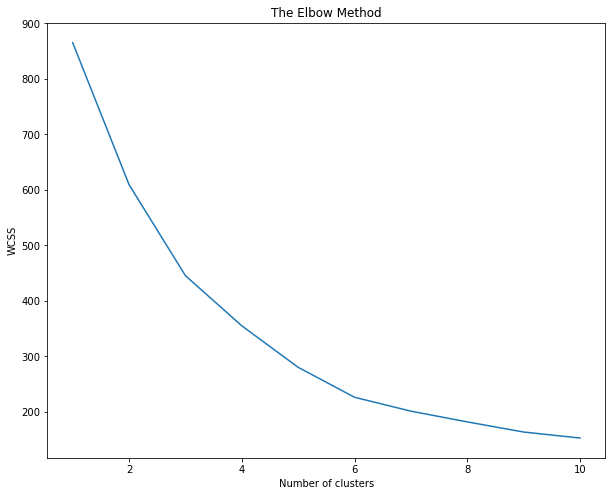

In [129]:
from sklearn.cluster import KMeans
fig=plt.figure(figsize=(10,8))
WCSS=[]
for i in range(1,11):
    clf=KMeans(n_clusters=i)
    clf.fit(df_norm)
    WCSS.append(clf.inertia_)
plt.plot(range(1,11),WCSS)   
plt.title('The Elbow Method')
plt.ylabel('WCSS')
plt.xlabel('Number of clusters')
plt.show()

In [130]:
clf =KMeans(n_clusters=6)
y_kmeans=clf.fit_predict(df_norm)

In [131]:
y_kmeans
clf.labels_

array([2, 2, 2, ..., 0, 0, 0])

In [132]:
md=pd.Series(y_kmeans)
covid['clust']=md
covid

<IPython.core.display.Javascript object>

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,clust
0,0,0.000000e+00,0.000000e+00,3.888861e+05,7.453608e+04,5.754796e+04,0.000000,0.000000,1.807364,2279.31582,11,2
1,0,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,6.400000e+01,6.174785,5.243503,1.807364,22.00000,11,2
2,0,1.280000e+02,1.280000e+02,3.888861e+05,7.453608e+04,6.400000e+01,0.000000,0.000000,1.807364,22.00000,11,2
3,0,1.880000e+02,1.880000e+02,3.888861e+05,6.000000e+01,6.300000e+01,0.010000,0.010000,1.807364,22.00000,11,2
4,0,2.660000e+02,2.660000e+02,3.888861e+05,7.800000e+01,6.600000e+01,0.010000,0.010000,1.807364,23.00000,11,2
5,0,3.080000e+02,3.080000e+02,3.888861e+05,4.200000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11,2
6,0,3.690000e+02,3.690000e+02,3.888861e+05,6.100000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11,2
7,0,4.050000e+02,4.050000e+02,3.888861e+05,3.600000e+01,5.800000e+01,0.010000,0.010000,1.807364,20.00000,11,2
8,0,4.470000e+02,4.470000e+02,3.888861e+05,4.200000e+01,5.500000e+01,0.020000,0.020000,1.807364,19.00000,11,2
9,0,4.830000e+02,4.830000e+02,3.888861e+05,3.600000e+01,5.100000e+01,0.020000,0.020000,1.807364,18.00000,11,2


In [133]:
covid.iloc[:,0:].groupby(covid.clust).mean()

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,clust
clust,,,,,,,,,,,,
0,79.677638,1.289188e+06,1.184629e+06,2.951106e+05,6.453519e+04,5.136318e+04,6.412340,5.082395,1.367318,2503.203445,4.199419,0.0
1,33.571053,1.135346e+06,9.276688e+05,2.884934e+05,6.067376e+04,4.098059e+04,4.105871,3.756071,1.403729,1628.619669,2.461404,1.0
2,18.682809,1.224954e+06,9.642067e+05,3.285298e+05,6.447733e+04,5.911529e+04,4.772924,4.406217,1.591442,1614.948453,12.739709,2.0
3,74.998020,1.071744e+06,1.032043e+06,3.483009e+05,6.359401e+04,2.575563e+04,4.737645,4.784790,1.710241,1566.386036,12.653465,3.0
4,48.428571,2.074622e+06,1.333029e+06,8.341791e+05,6.213617e+04,5.536970e+04,51.937262,37.190595,15.158658,18521.952381,7.047619,4.0
5,96.000000,3.713750e+07,2.851717e+07,8.268333e+06,1.397434e+06,1.354941e+06,11.104194,8.527097,2.471935,4051.354839,3.000000,5.0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Clusters using KMeans')

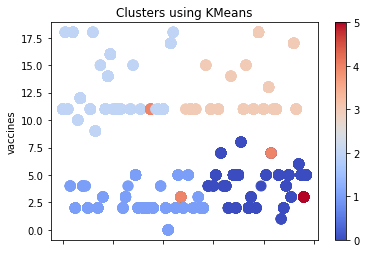

In [134]:
covid.plot(x="country",y="vaccines",c=clf.labels_,kind="scatter",s=100,cmap=plt.cm.coolwarm)
plt.title("Clusters using KMeans")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Clusters using KMeans')

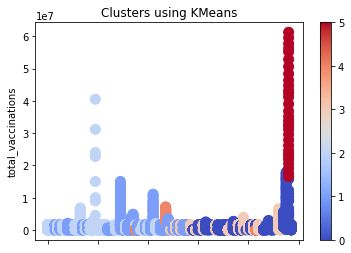

In [135]:
covid.plot(x="country",y="total_vaccinations",c=clf.labels_,kind="scatter",s=100,cmap=plt.cm.coolwarm)
plt.title("Clusters using KMeans")

## DBSCAN approach

In [136]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [137]:
covid.head(5)

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,clust
0,0,0.000000e+00,0.000000e+00,388886.080816,74536.080238,57547.964686,0.000000,0.000000,1.807364,2279.31582,11,2
1,0,1.521028e+06,1.269657e+06,388886.080816,74536.080238,64.000000,6.174785,5.243503,1.807364,22.00000,11,2
2,0,1.280000e+02,1.280000e+02,388886.080816,74536.080238,64.000000,0.000000,0.000000,1.807364,22.00000,11,2
3,0,1.880000e+02,1.880000e+02,388886.080816,60.000000,63.000000,0.010000,0.010000,1.807364,22.00000,11,2
4,0,2.660000e+02,2.660000e+02,388886.080816,78.000000,66.000000,0.010000,0.010000,1.807364,23.00000,11,2


In [138]:
covid1=covid.drop(['clust'],axis=1)

In [139]:
array=covid1.values
array

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.80736405e+00, 2.27931582e+03, 1.10000000e+01],
       [0.00000000e+00, 1.52102774e+06, 1.26965667e+06, ...,
        1.80736405e+00, 2.20000000e+01, 1.10000000e+01],
       [0.00000000e+00, 1.28000000e+02, 1.28000000e+02, ...,
        1.80736405e+00, 2.20000000e+01, 1.10000000e+01],
       ...,
       [9.70000000e+01, 8.41975000e+05, 8.22633000e+05, ...,
        6.10000000e-01, 6.98200000e+03, 5.00000000e+00],
       [9.70000000e+01, 8.64498000e+05, 8.39065000e+05, ...,
        8.10000000e-01, 6.54900000e+03, 5.00000000e+00],
       [9.70000000e+01, 8.85906000e+05, 8.53904000e+05, ...,
        1.02000000e+00, 5.99200000e+03, 5.00000000e+00]])

In [140]:
stscalar=StandardScaler().fit(array)
X=stscalar.transform(array)
X

array([[-1.72458605e+00, -3.71327688e-01, -4.13769347e-01, ...,
         7.97599894e-17,  0.00000000e+00,  8.34871659e-01],
       [-1.72458605e+00,  5.68408206e-17, -7.58773496e-17, ...,
         7.97599894e-17, -6.07452994e-01,  8.34871659e-01],
       [-1.72458605e+00, -3.71296440e-01, -4.13727633e-01, ...,
         7.97599894e-17, -6.07452994e-01,  8.34871659e-01],
       ...,
       [ 1.62151771e+00, -1.65776782e-01, -1.45680874e-01, ...,
        -4.30101618e-01,  1.26551170e+00, -3.68314324e-01],
       [ 1.62151771e+00, -1.60278254e-01, -1.40325837e-01, ...,
        -3.58260206e-01,  1.14898962e+00, -3.68314324e-01],
       [ 1.62151771e+00, -1.55051930e-01, -1.35489945e-01, ...,
        -2.82826724e-01,  9.99098620e-01, -3.68314324e-01]])

In [182]:
dbscan=DBSCAN(eps=0.40,min_samples=6)
dbscan.fit(X)

DBSCAN(eps=0.4, min_samples=6)

In [183]:
dbscan.labels_  #Noisy samples given label -1

array([12,  0, -1, ..., 79, 79, -1], dtype=int64)

In [186]:
DB_cluster=pd.DataFrame(dbscan.labels_,columns=['DB_cluster']) 

<IPython.core.display.Javascript object>

In [187]:
DB_cluster
pd.set_option("display.max_rows", None)

<IPython.core.display.Javascript object>

In [188]:
DB_cluster

,DB_cluster
0,12
1,0
2,-1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [189]:
covid1=pd.concat([covid1,DB_cluster],axis=1)
covid1

<IPython.core.display.Javascript object>

,country,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,DB_cluster,DB_cluster,DB_cluster,DB_cluster
0,0,0.000000e+00,0.000000e+00,3.888861e+05,7.453608e+04,5.754796e+04,0.000000,0.000000,1.807364,2279.31582,11,0,9,7,12
1,0,1.521028e+06,1.269657e+06,3.888861e+05,7.453608e+04,6.400000e+01,6.174785,5.243503,1.807364,22.00000,11,1,0,0,0
2,0,1.280000e+02,1.280000e+02,3.888861e+05,7.453608e+04,6.400000e+01,0.000000,0.000000,1.807364,22.00000,11,0,-1,-1,-1
3,0,1.880000e+02,1.880000e+02,3.888861e+05,6.000000e+01,6.300000e+01,0.010000,0.010000,1.807364,22.00000,11,0,1,1,1
4,0,2.660000e+02,2.660000e+02,3.888861e+05,7.800000e+01,6.600000e+01,0.010000,0.010000,1.807364,23.00000,11,0,1,1,1
5,0,3.080000e+02,3.080000e+02,3.888861e+05,4.200000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11,0,1,1,1
6,0,3.690000e+02,3.690000e+02,3.888861e+05,6.100000e+01,6.200000e+01,0.010000,0.010000,1.807364,22.00000,11,0,1,1,1
7,0,4.050000e+02,4.050000e+02,3.888861e+05,3.600000e+01,5.800000e+01,0.010000,0.010000,1.807364,20.00000,11,0,1,1,1
8,0,4.470000e+02,4.470000e+02,3.888861e+05,4.200000e+01,5.500000e+01,0.020000,0.020000,1.807364,19.00000,11,0,1,1,1
9,0,4.830000e+02,4.830000e+02,3.888861e+05,3.600000e+01,5.100000e+01,0.020000,0.020000,1.807364,18.00000,11,0,1,1,1


In [190]:
import matplotlib.pyplot as plt
plt.style.use('classic')

Text(0.5, 1.0, 'Cluesters using DBSCAN')

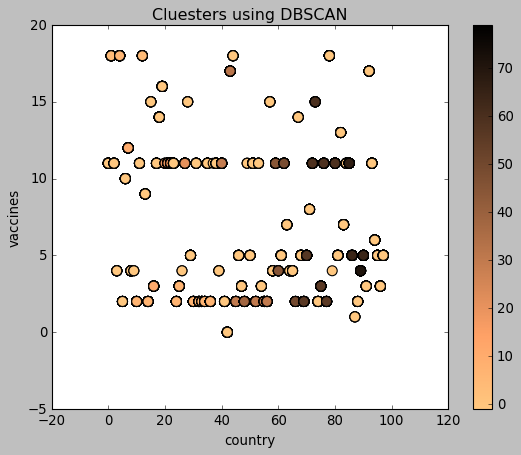

In [191]:
covid1.plot(x='country',y='vaccines',c=dbscan.labels_,kind='scatter',s=80,cmap=plt.cm.copper_r)
plt.title("Cluesters using DBSCAN")

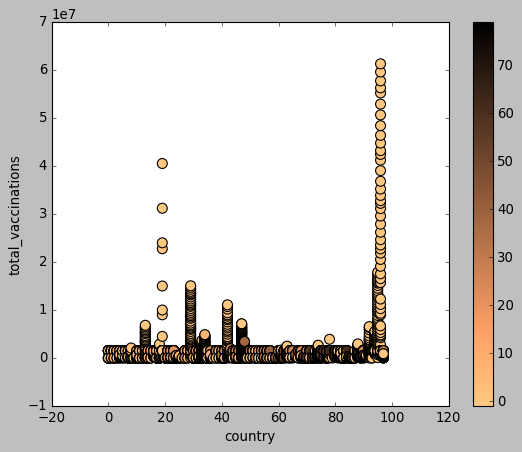

In [192]:
covid1.plot(x='country',y='total_vaccinations',c=dbscan.labels_,kind='scatter',s=80,cmap=plt.cm.copper_r)

In [184]:
dl=dbscan.labels_

In [185]:
sklearn.metrics.silhouette_score(X,dl)

<IPython.core.display.Javascript object>

0.1121535737350586